<a href="https://colab.research.google.com/github/datascience-uniandes/linear-regression-tutorial/blob/master/forestfires.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Linear Regression basic tutorial

MINE-4101: Applied Data Science  
Univerisdad de los Andes  
  
Last update: September, 2022  
  
Dataset: Forest Fires  
Source: [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/forest+fires)

**Task:** Predict the burned area of forest fires, in the northeast region of Portugal, by using meteorological and other data.

**Data dictionary:**
1. X - x-axis spatial coordinate within the Montesinho park map: 1 to 9
2. Y - y-axis spatial coordinate within the Montesinho park map: 2 to 9
3. month - month of the year: 'jan' to 'dec'
4. day - day of the week: 'mon' to 'sun'
5. FFMC - FFMC index from the FWI system: 18.7 to 96.20
6. DMC - DMC index from the FWI system: 1.1 to 291.3
7. DC - DC index from the FWI system: 7.9 to 860.6
8. ISI - ISI index from the FWI system: 0.0 to 56.10
9. temp - temperature in Celsius degrees: 2.2 to 33.30
10. RH - relative humidity in %: 15.0 to 100
11. wind - wind speed in km/h: 0.40 to 9.40
12. rain - outside rain in mm/m2 : 0.0 to 6.4
13. area - the burned area of the forest (in ha): 0.00 to 1090.84 (this output variable is very skewed towards 0.0, thus **it may make sense to model with the logarithm transform)**.

In [38]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport

### Reading the dataset

In [3]:
forest_df = pd.read_csv('./data/forestfires.csv', sep = ',')

In [4]:
forest_df.shape

(517, 13)

In [5]:
forest_df.dtypes

X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH         int64
wind     float64
rain     float64
area     float64
dtype: object

In [6]:
forest_df.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


### Profiling the data

In [7]:
profile = ProfileReport(forest_df)

In [8]:
profile.to_notebook_iframe()

### Analyzing the target

In [9]:
forest_df['area'].describe(percentiles = [.25, .5, .75, .95, .99])

count     517.000000
mean       12.847292
std        63.655818
min         0.000000
25%         0.000000
50%         0.520000
75%         6.570000
95%        48.714000
99%       194.764800
max      1090.840000
Name: area, dtype: float64

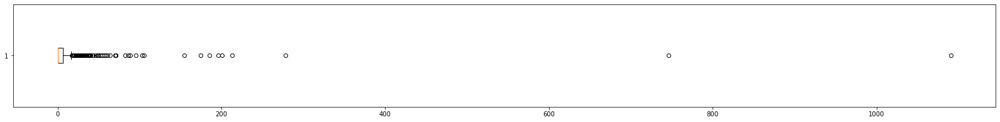

In [10]:
plt.figure(figsize = (28, 3))
plt.boxplot(forest_df['area'], vert = False)
plt.show()

In [14]:
forest_no_outliers_df = forest_df.loc[forest_df['area'] <= forest_df['area'].quantile(.95)]

In [15]:
forest_no_outliers_df.shape

(491, 13)

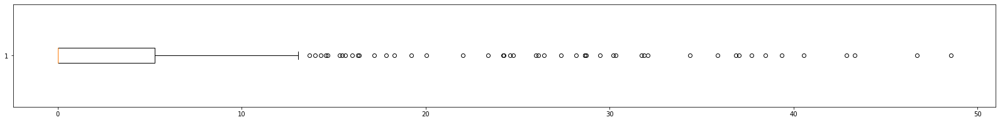

In [16]:
plt.figure(figsize = (28, 3))
plt.boxplot(forest_no_outliers_df['area'], vert = False)
plt.show()

### Features to train the model

In [19]:
features = ['X', 'Y', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain']

In [21]:
forest_no_outliers_df[features + ['area']].corr()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
X,1.000000,0.538379,-0.022468,-0.034490,-0.075907,-0.004078,-0.062918,0.099554,0.004938,0.068599,0.033382
Y,0.538379,1.000000,-0.052268,0.005780,-0.102913,-0.031123,-0.038334,0.077427,-0.033426,0.034922,-0.010280
FFMC,-0.022468,-0.052268,1.000000,0.380021,0.331618,0.528665,0.434629,-0.291889,-0.028784,0.057536,0.039010
DMC,-0.034490,0.005780,0.380021,1.000000,0.684865,0.312442,0.465206,0.093719,-0.103661,0.077761,0.021628
DC,-0.075907,-0.102913,0.331618,0.684865,1.000000,0.238303,0.495268,-0.028252,-0.197347,0.037152,0.023261
ISI,-0.004078,-0.031123,0.528665,0.312442,0.238303,1.000000,0.403786,-0.122332,0.096988,0.068578,-0.001306
temp,-0.062918,-0.038334,0.434629,0.465206,0.495268,0.403786,1.000000,-0.524777,-0.237271,0.073159,-0.034710
RH,0.099554,0.077427,-0.291889,0.093719,-0.028252,-0.122332,-0.524777,1.000000,0.074530,0.100153,0.002247
wind,0.004938,-0.033426,-0.028784,-0.103661,-0.197347,0.096988,-0.237271,0.074530,1.000000,0.062258,0.091638
rain,0.068599,0.034922,0.057536,0.077761,0.037152,0.068578,0.073159,0.100153,0.062258,1.000000,0.017713


### Splitting train and test datasets

In [22]:
X = forest_no_outliers_df[features]

In [23]:
Y = forest_no_outliers_df['area']

In [33]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 1)

In [34]:
X_train.shape

(392, 10)

In [35]:
X_test.shape

(99, 10)

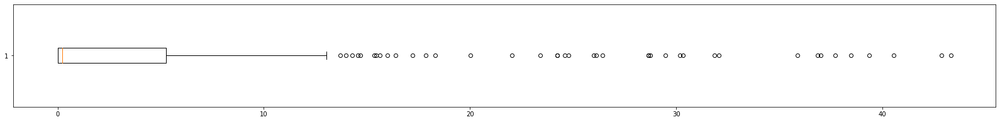

In [36]:
plt.figure(figsize = (28, 3))
plt.boxplot(Y_train, vert = False)
plt.show()

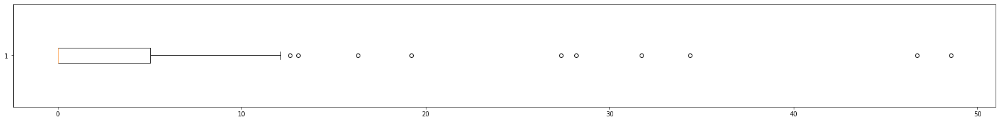

In [37]:
plt.figure(figsize = (28, 3))
plt.boxplot(Y_test, vert = False)
plt.show()

### Scaling features

In [39]:
scaler = StandardScaler()

In [40]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Training the model

In [41]:
regr = linear_model.LinearRegression()

In [42]:
regr.fit(X_train_scaled, Y_train)

LinearRegression()

In [43]:
regr.coef_

array([ 0.6831938 , -0.3866483 ,  0.44952379,  0.28948004,  0.22274893,
       -0.37478208, -0.46249133, -0.05402075,  0.64070972,  0.19685585])

In [44]:
regr.intercept_

4.439591836734695

### Evaluating the model

In [51]:
preds_train = regr.predict(X_train_scaled)
preds_test = regr.predict(X_test_scaled)

In [53]:
mean_absolute_error(Y_train, preds_train), mean_absolute_error(Y_test, preds_test)

(5.491407506498462, 5.911794657776146)

In [56]:
np.sqrt(mean_squared_error(Y_train, preds_train)), np.sqrt(mean_squared_error(Y_test, preds_test))

(8.285320101385702, 9.152114859522033)

### Error analysis

In [61]:
(Y_test - preds_test).describe(percentiles = [.25, .5, .75, .95, .99])

count    99.000000
mean     -0.177098
std       9.196968
min      -7.072891
25%      -4.754284
50%      -3.643586
75%       1.557219
95%      21.530835
99%      41.305578
max      43.496897
Name: area, dtype: float64

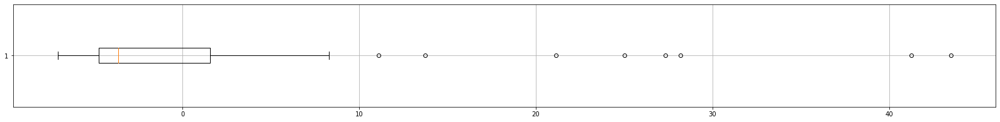

In [59]:
plt.figure(figsize = (28, 3))
plt.boxplot((Y_test - preds_test), vert = False)
plt.grid()
plt.show()

In [112]:
worst_condition = np.where((Y_test - preds_test) > 3, True, False)

In [113]:
worst_cases = pd.concat([
    X_test.loc[worst_condition],
    Y_test.loc[worst_condition]
], axis = 1).reset_index(drop = True)

In [114]:
worst_cases['predictions'] = pd.Series(preds_test).loc[worst_condition].reset_index(drop = True)

In [116]:
worst_cases.shape

(17, 12)

In [115]:
worst_cases

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,predictions
0,6,5,91.2,94.3,744.4,8.4,16.8,47,4.9,0.0,12.64,5.312360
1,4,5,92.9,137.0,706.4,9.2,21.5,15,0.9,0.0,11.06,3.262645
2,4,6,84.4,27.2,353.5,6.8,4.8,57,8.5,0.0,8.98,5.470905
3,7,3,87.6,52.2,103.8,5.0,11.0,46,5.8,0.0,27.35,6.206684
4,2,2,94.8,108.3,647.1,17.0,24.6,22,4.5,0.0,8.71,4.029825
5,2,5,91.0,129.5,692.6,7.0,17.6,46,3.1,0.0,7.04,3.620392
6,4,4,92.1,99.0,745.3,9.6,20.8,35,4.9,0.0,13.06,4.773252
7,6,3,92.8,119.0,783.5,7.5,18.9,34,7.2,0.0,34.36,7.015955
8,6,5,90.1,37.6,83.7,7.2,12.4,54,3.6,0.0,12.10,4.320958
9,4,5,92.9,133.3,699.6,9.2,19.4,19,1.3,0.0,31.72,3.534200
